Libraries

In [8]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import math
import time
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image
from sklearn.metrics import confusion_matrix

import torch
import torch.nn as nn
import torch.optim as optim

import torchvision
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.transforms as transforms

# my libraries
from train import train_model
from model_utils import *
from predict_utils import *
from vis_utils import *

# some initial setup
np.set_printoptions(precision=2)
use_gpu = torch.cuda.is_available()
np.random.seed(1234)

#read image data
from itkwidgets import view
import itkwidgets
import nibabel as nib

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tifffile import imsave,imwrite

from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler() #set min=0 max=1 unless you define min and max

import splitfolders

import pandas as pd
import segmentation_models_3D as sm
import keras

from focal_loss import BinaryFocalLoss

In [9]:
use_gpu = torch.cuda.is_available()
use_gpu

True

In [10]:
TRAIN_DATASET_PATH='BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/'

Load one flair image find the maximum and set the values between 0 and 1

In [11]:
test_image_flair=nib.load(TRAIN_DATASET_PATH+'BraTS20_Training_355/BraTS20_Training_355_flair.nii').get_fdata()
print(test_image_flair.max())


test_image_flair=scaler.fit_transform(test_image_flair.reshape(-1, test_image_flair.shape[-1])).reshape(test_image_flair.shape)
print(test_image_flair.max())

1854.603271484375
1.0


In [12]:
print(test_image_flair.shape)

(240, 240, 155)


Load one t1 image find the maximum and set the values between 0 and 1

In [13]:
test_image_t1=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_355/BraTS20_Training_355_t1.nii').get_fdata()
print(test_image_t1.max())

test_image_t1=scaler.fit_transform(test_image_t1.reshape(-1, test_image_t1.shape[-1])).reshape(test_image_t1.shape)
print(test_image_t1.max())

1717.368408203125
1.0


Load one t1ce image find the maximum and set the values between 0 and 1

In [14]:
test_image_t1ce=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_355/BraTS20_Training_355_t1ce.nii').get_fdata()
print(test_image_t1ce.max())
print(test_image_t1ce.reshape(-1, test_image_t1ce.shape[-1]).shape)

test_image_t1ce=scaler.fit_transform(test_image_t1ce.reshape(-1, test_image_t1ce.shape[-1])).reshape(test_image_t1ce.shape)
print(test_image_t1ce.max())

8309.0
(57600, 155)
1.0


Load one t2 image find the maximum and set the values between 0 and 1

In [15]:
test_image_t2=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_355/BraTS20_Training_355_t2.nii').get_fdata()
print(test_image_t2.max())

test_image_t2=scaler.fit_transform(test_image_t2.reshape(-1, test_image_t2.shape[-1])).reshape(test_image_t2.shape)
print(test_image_t2.max())

5822.11474609375
1.0


Load one label image find the maximum 

In [16]:
test_mask=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_355/BraTS20_Training_355_seg.nii').get_fdata()

print(test_mask.max())
print(test_mask.min())
print(test_mask.dtype)

test_mask=test_mask.astype(np.uint8)
print(test_mask.max())
print(test_mask.min())
print(test_mask.dtype)

print(np.unique(test_mask))

test_mask[test_mask==4]=3

print(np.unique(test_mask))

print(test_mask.shape)

4.0
0.0
float64
4
0
uint8
[0 1 2 4]
[0 1 2 3]
(240, 240, 155)


Plotting one sample randomly

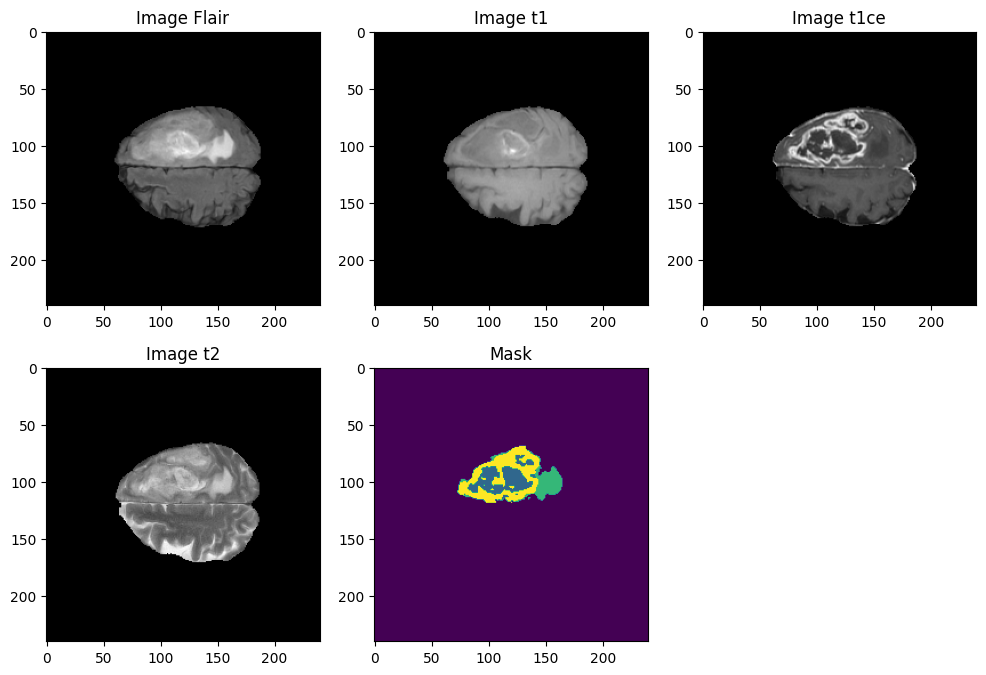

In [17]:
import random
n_slice=random.randint(0,test_mask.shape[2]-1)

plt.figure(figsize=(12,8))

plt.subplot(231)
plt.imshow(test_image_flair[:,:,n_slice-1],cmap='gray')
plt.title('Image Flair')

plt.subplot(232)
plt.imshow(test_image_t1[:,:,n_slice],cmap='gray')
plt.title('Image t1')


plt.subplot(233)
plt.imshow(test_image_t1ce[:,:,n_slice],cmap='gray')
plt.title('Image t1ce')


plt.subplot(234)
plt.imshow(test_image_t2[:,:,n_slice],cmap='gray')
plt.title('Image t2')

plt.subplot(235)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')

plt.show()

We should combine flair, t1ce and t2 for each slice to get more information

In [18]:
combined_x = np.stack([test_image_flair, test_image_t1ce, test_image_t2], axis=3)
print(combined_x.shape)

(240, 240, 155, 3)


We should crop the images since there are many black pixels that we don't need and is zoomed out

In [19]:
combined_x=combined_x[56:184, 56:184, 13:141] #Crop to 128x128x128x4
#Do the same for mask
test_mask = test_mask[56:184, 56:184, 13:141] 

print(test_mask.shape)
print(np.unique(test_mask))

(128, 128, 128)
[0 1 2 3]


Let's plot one random sample again

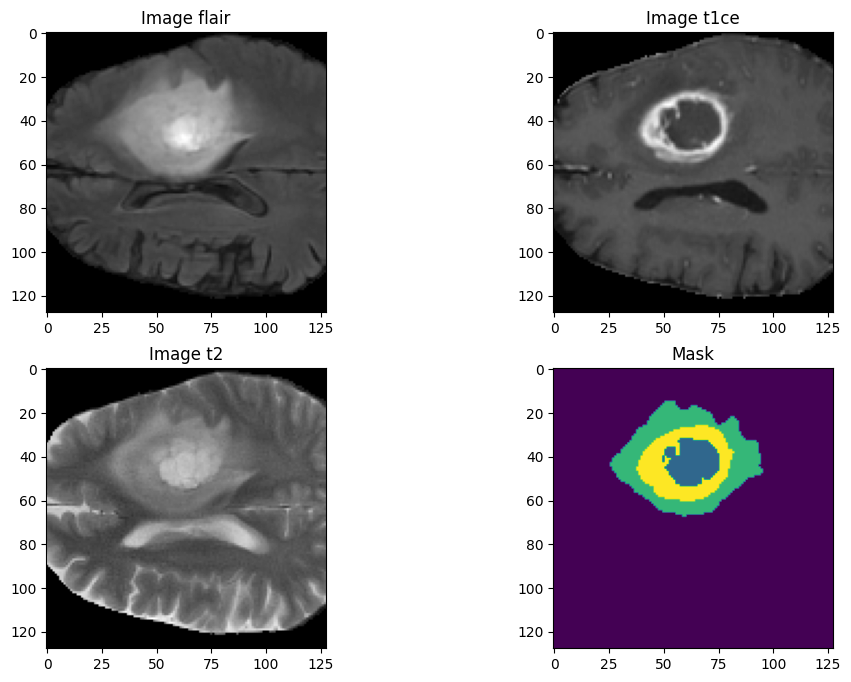

In [20]:
n_slice=random.randint(0, test_mask.shape[2]-1)
plt.figure(figsize=(12, 8))

plt.subplot(221)
plt.imshow(combined_x[:,:,n_slice, 0], cmap='gray')
plt.title('Image flair')
plt.subplot(222)
plt.imshow(combined_x[:,:,n_slice, 1], cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(combined_x[:,:,n_slice, 2], cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('Mask')
plt.show()

Let's save the modified images

In [21]:
imwrite('BraTS2020_TrainingData/combined255.tif', combined_x)
np.save('BraTS2020_TrainingData/combined255.npy', combined_x)

my_img=np.load('BraTS2020_TrainingData/combined255.npy')
print(my_img.shape)

arrays_equal=(combined_x==my_img).all() #sanity check
print(arrays_equal)

(128, 128, 128, 3)
True


Test mask is now a 128 by 128 by 128 since it only has 4 values we can put them in 4 categories

In [22]:
print(test_mask.shape)

test_mask = to_categorical(test_mask, num_classes=4)

print(test_mask.shape)
print(test_mask[1,1,1,:]) #one hot coding

(128, 128, 128)
(128, 128, 128, 4)
[1. 0. 0. 0.]


Let's start working with the images of all the 369 subjects

In [23]:
#TRAIN_DATASET_PATH='BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/'

t2_list=sorted(glob.glob(TRAIN_DATASET_PATH+'*/*t2.nii'))
t1ce_list=sorted(glob.glob(TRAIN_DATASET_PATH+'*/*t1ce.nii'))
flair_list=sorted(glob.glob(TRAIN_DATASET_PATH+'*/*flair.nii'))
mask_list=sorted(glob.glob(TRAIN_DATASET_PATH+'*/*seg.nii'))

print(len(t2_list)) #369 for training

369


In [24]:
print(np.unique(test_mask)) #this is after categorical! one hot encoding

[0. 1.]


In [25]:
val, counts = np.unique(test_mask, return_counts=True) #this is after categorical!
print(val)
print(counts) #how much black pixel the mask contains 

[0. 1.]
[6291456 2097152]


Let's prepare all the 369 train images!

In [20]:
for img in range(369):
    print('Preparing image and mask of subject number: ',img)
    
    temp_image_t2=nib.load(t2_list[img]).get_fdata()
    temp_image_t2=scaler.fit_transform(temp_image_t2.reshape(-1,temp_image_t2.shape[-1])).reshape(temp_image_t2.shape)
    
    temp_image_t1ce=nib.load(t1ce_list[img]).get_fdata()
    temp_image_t1ce=scaler.fit_transform(temp_image_t1ce.reshape(-1,temp_image_t1ce.shape[-1])).reshape(temp_image_t1ce.shape)
    
    temp_image_flair=nib.load(flair_list[img]).get_fdata()
    temp_image_flair=scaler.fit_transform(temp_image_flair.reshape(-1,temp_image_flair.shape[-1])).reshape(temp_image_flair.shape)
    
    temp_mask=nib.load(mask_list[img]).get_fdata()
    temp_mask=temp_mask.astype(np.uint8)
    temp_mask[temp_mask==4] = 3 
    
    temp_combined_images = np.stack([temp_image_flair, temp_image_t1ce, temp_image_t2], axis=3)
    
    temp_combined_images=temp_combined_images[56:184, 56:184, 13:141]
    temp_mask = temp_mask[56:184, 56:184, 13:141]
    
    val, counts = np.unique(temp_mask, return_counts=True)
    
    if (1 - (counts[0]/counts.sum())) > 0.01:  #At least 1% useful volume with labels that are not 0 (black)
        print("Save Me")
        temp_mask= to_categorical(temp_mask, num_classes=4)
        np.save('BraTS2020_TrainingData/input_data_3channels/images/image_'+str(img)+'.npy', temp_combined_images)
        np.save('BraTS2020_TrainingData/input_data_3channels/masks/mask_'+str(img)+'.npy', temp_mask)
        
    else:
        print("I am useless")   
        
    

Preparing image and mask of subject number:  0
Save Me
Preparing image and mask of subject number:  1
Save Me
Preparing image and mask of subject number:  2
Save Me
Preparing image and mask of subject number:  3
Save Me
Preparing image and mask of subject number:  4
I am useless
Preparing image and mask of subject number:  5
Save Me
Preparing image and mask of subject number:  6
Save Me
Preparing image and mask of subject number:  7
Save Me
Preparing image and mask of subject number:  8
Save Me
Preparing image and mask of subject number:  9
Save Me
Preparing image and mask of subject number:  10
Save Me
Preparing image and mask of subject number:  11
Save Me
Preparing image and mask of subject number:  12
Save Me
Preparing image and mask of subject number:  13
Save Me
Preparing image and mask of subject number:  14
Save Me
Preparing image and mask of subject number:  15
Save Me
Preparing image and mask of subject number:  16
Save Me
Preparing image and mask of subject number:  17
Save 

Save Me
Preparing image and mask of subject number:  145
Save Me
Preparing image and mask of subject number:  146
Save Me
Preparing image and mask of subject number:  147
Save Me
Preparing image and mask of subject number:  148
Save Me
Preparing image and mask of subject number:  149
Save Me
Preparing image and mask of subject number:  150
Save Me
Preparing image and mask of subject number:  151
Save Me
Preparing image and mask of subject number:  152
Save Me
Preparing image and mask of subject number:  153
Save Me
Preparing image and mask of subject number:  154
Save Me
Preparing image and mask of subject number:  155
Save Me
Preparing image and mask of subject number:  156
Save Me
Preparing image and mask of subject number:  157
Save Me
Preparing image and mask of subject number:  158
Save Me
Preparing image and mask of subject number:  159
Save Me
Preparing image and mask of subject number:  160
Save Me
Preparing image and mask of subject number:  161
Save Me
Preparing image and mas

Save Me
Preparing image and mask of subject number:  289
Save Me
Preparing image and mask of subject number:  290
Save Me
Preparing image and mask of subject number:  291
Save Me
Preparing image and mask of subject number:  292
Save Me
Preparing image and mask of subject number:  293
Save Me
Preparing image and mask of subject number:  294
Save Me
Preparing image and mask of subject number:  295
Save Me
Preparing image and mask of subject number:  296
Save Me
Preparing image and mask of subject number:  297
Save Me
Preparing image and mask of subject number:  298
Save Me
Preparing image and mask of subject number:  299
Save Me
Preparing image and mask of subject number:  300
Save Me
Preparing image and mask of subject number:  301
Save Me
Preparing image and mask of subject number:  302
Save Me
Preparing image and mask of subject number:  303
Save Me
Preparing image and mask of subject number:  304
Save Me
Preparing image and mask of subject number:  305
Save Me
Preparing image and mas

Let's split the data (from trainig data folder) into train and validation for development

In [18]:
input_folder = 'BraTS2020_TrainingData/input_data_3channels/'
output_folder = 'BraTS2020_TrainingData/input_data_128/'
# Split with a ratio.
# To only split into training and validation set, set a tuple to `ratio`, i.e, `(.8, .2)`.
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(.75, .25), group_prefix=None) # default values

Copying files: 688 files [00:40, 17.16 files/s]


Let's start working with the data

In [26]:
def load_img(img_dir,img_list):
    images=[]
    for i, image_name in enumerate(img_list):
        if (image_name.split('.')[1]=='npy'):
            image=np.load(img_dir+image_name)
            images.append(image)
    images=np.array(images)
    
    return images

In [27]:
def imageLoader(img_dir,img_list,mask_dir,mask_list,batch_size):
    L=len(img_list)
    while True:
        batch_start=0
        batch_end=batch_size
        while batch_start<L:
            limit=min(batch_end,L)
            
            X=load_img(img_dir, img_list[batch_start:limit])
            Y=load_img(mask_dir, mask_list[batch_start:limit])
            
            yield (X,Y)
            
            batch_start+=batch_size
            batch_end+=batch_size
            
            

In [28]:
train_img_dir='BraTS2020_TrainingData/input_data_128/train/images/'
train_mask_dir='BraTS2020_TrainingData/input_data_128/train/masks/'

train_img_list=os.listdir(train_img_dir)
train_mask_list=os.listdir(train_mask_dir)

In [29]:
batch_size=10
train_img_datagen=imageLoader(train_img_dir,train_img_list,
                              train_mask_dir,train_mask_list,batch_size)

img,msk=train_img_datagen.__next__()#data of 2 first subjects


img_num=random.randint(0,img.shape[0]-1) #one random imge from 2 images in the batch

print(img_num)

print(img.shape)
print(msk.shape)

test_img=img[img_num]
print(test_img.shape)

test_mask=msk[img_num]
print(test_mask.shape)

test_mask=np.argmax(test_mask,axis=3)
print(test_mask.shape) #where it is labeled as 3 

img,msk=train_img_datagen.__next__()
print(img[0].shape)
print(msk[0].shape)


9
(10, 128, 128, 128, 3)
(10, 128, 128, 128, 4)
(128, 128, 128, 3)
(128, 128, 128, 4)
(128, 128, 128)
(128, 128, 128, 3)
(128, 128, 128, 4)


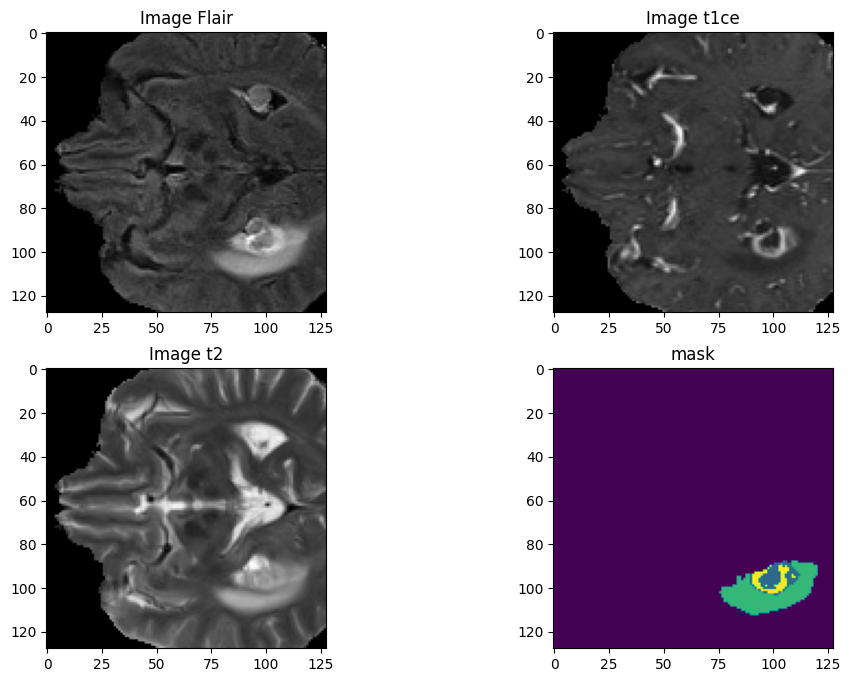

In [23]:
n_slice=np.random.randint(0,test_mask.shape[2]-1)
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.imshow(test_img[:,:,n_slice,0],cmap='gray')
plt.title('Image Flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice,1],cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice,2],cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('mask')
plt.show()

Get the distribution of labels

In [30]:
columns=['0','1','2','3']
df=pd.DataFrame(columns=columns)
train_mask_list=sorted(glob.glob('BraTS2020_TrainingData/input_data_128/train/masks/*.npy'))

for img in range(len(train_mask_list)):
    temp_image=np.load(train_mask_list[img])
    temp_image=np.argmax(temp_image,axis=3)
    val, counts= np.unique(temp_image,return_counts=True)
    zipped = zip(columns, counts)
    conts_dict=dict(zipped)
    
    df=df.append(conts_dict,ignore_index=True)
    
label_0=df['0'].sum()
label_1=df['1'].sum()
label_2=df['2'].sum()
label_3=df['3'].sum()

total_labels=label_0+label_1+label_2+label_3
n_classes=4

    
wt0=round((total_labels/(n_classes*label_0)),2)
wt1=round((total_labels/(n_classes*label_1)),2)
wt2=round((total_labels/(n_classes*label_2)),2)
wt3=round((total_labels/(n_classes*label_3)),2)




The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

Let's check everything on train and validation

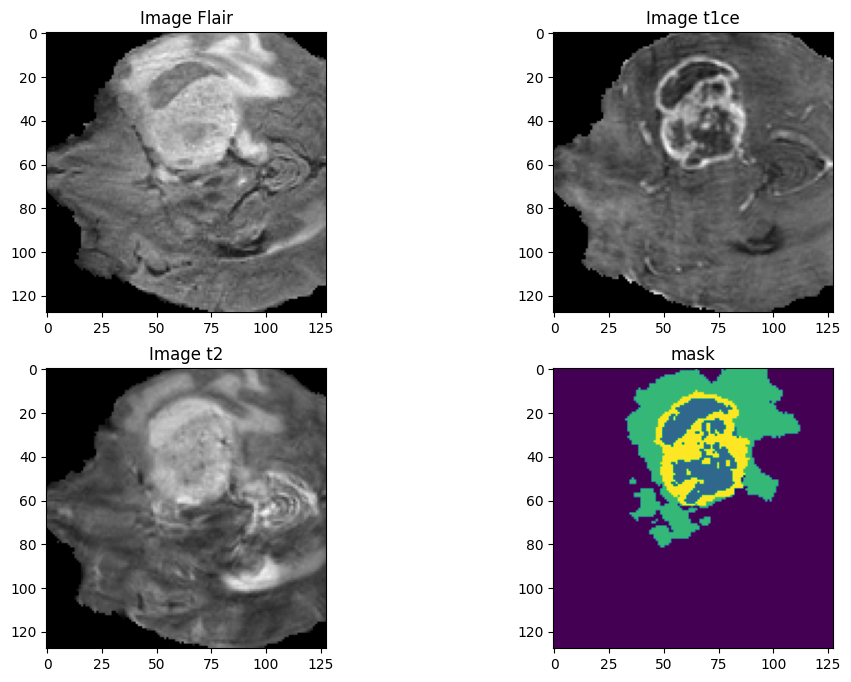

In [31]:
train_img_dir='BraTS2020_TrainingData/input_data_128/train/images/'
train_mask_dir='BraTS2020_TrainingData/input_data_128/train/masks/'
train_img_list=os.listdir(train_img_dir)
train_mask_list=os.listdir(train_mask_dir)

val_img_dir='BraTS2020_TrainingData/input_data_128/val/images/'
val_mask_dir='BraTS2020_TrainingData/input_data_128/val/masks/'
val_img_list=os.listdir(val_img_dir)
val_mask_list=os.listdir(val_mask_dir)

batch_size=2
train_img_datagen=imageLoader(train_img_dir,train_img_list,
                              train_mask_dir,train_mask_list,batch_size)

img,msk=train_img_datagen.__next__()

img_num=random.randint(0,img.shape[0]-1) #one random imge from 2 images in the batch
test_img=img[img_num]
test_mask=msk[img_num]
test_mask=np.argmax(test_mask,axis=3)
n_slice=np.random.randint(0,test_mask.shape[2])
plt.figure(figsize=(12,8))
plt.subplot(221)
plt.imshow(test_img[:,:,n_slice,0],cmap='gray')
plt.title('Image Flair')
plt.subplot(222)
plt.imshow(test_img[:,:,n_slice,1],cmap='gray')
plt.title('Image t1ce')
plt.subplot(223)
plt.imshow(test_img[:,:,n_slice,2],cmap='gray')
plt.title('Image t2')
plt.subplot(224)
plt.imshow(test_mask[:,:,n_slice])
plt.title('mask')
plt.show()


val_img_datagen=imageLoader(val_img_dir,val_img_list,
                              val_mask_dir,val_mask_list,batch_size)

img,msk=val_img_datagen.__next__()


In [26]:
print(wt0,wt1,wt2,wt3)
print(label_0,label_1,label_2,label_3)

0.26 22.92 9.02 26.66
515098764 5901688 14990686 5074078


In [32]:
#tf.debugging.set_log_device_placement(True)
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())
sess = tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))
tf.test.gpu_device_name()

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 14335645723451591805
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 6245318656
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13019559181964803864
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080 Super with Max-Q Design, pci bus id: 0000:01:00.0, compute capability: 7.5"
xla_global_id: 416903419
]
Device mapping:
/job:localhost/replica:0/task:0/device:GPU:0 -> device: 0, name: NVIDIA GeForce RTX 2080 Super with Max-Q Design, pci bus id: 0000:01:00.0, compute capability: 7.5



'/device:GPU:0'

Let's do the training in keras!

In [31]:
#do the training in keras
tf.debugging.set_log_device_placement(True)
wt0,wt1,wt2,wt3=0.25,0.25,0.25,0.25
dice_loss=sm.losses.DiceLoss(class_weights=np.array([wt0,wt1,wt2,wt3]))
focal_loss=sm.losses.CategoricalFocalLoss()
total_loss=dice_loss+(1*focal_loss)
metrics=['accuracy',sm.metrics.IOUScore(threshold=0.5)]
LR=0.0001
optim=keras.optimizers.Adam(LR)
 
steps_per_epoch=len(train_img_list)//batch_size
val_steps_per_epoch=len(val_img_list)//batch_size

from simple_3d_unet import simple_unet_model

model=simple_unet_model(IMG_HEIGHT=128,
                       IMG_WIDTH=128,
                       IMG_DEPTH=128,
                       IMG_CHANNELS=3,
                       num_classes=4)

model.compile(optimizer=optim,loss=total_loss,metrics=metrics)

print(model.summary())
print(model.input_shape)
print(model.output_shape)


history=model.fit(train_img_datagen,
                 steps_per_epoch=steps_per_epoch,
                 epochs=100,
                 verbose=1,
                 validation_data=val_img_datagen,
                 validation_steps=val_steps_per_epoch,)
model.save('brats_3d.hdf5')

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in d

Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
c9 shape is (None, 128, 128, 128, 16)
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/d

                                                                                                  
 conv3d_9 (Conv3D)              (None, 8, 8, 8, 256  1769728     ['dropout_4[0][0]']              
                                )                                                                 
                                                                                                  
 conv3d_transpose (Conv3DTransp  (None, 16, 16, 16,   262272     ['conv3d_9[0][0]']               
 ose)                           128)                                                              
                                                                                                  
 concatenate (Concatenate)      (None, 16, 16, 16,   0           ['conv3d_transpose[0][0]',       
                                256)                              'conv3d_7[0][0]']               
                                                                                                  
 conv3d_10

                                28, 3)]                                                           
                                                                                                  
 conv3d (Conv3D)                (None, 128, 128, 12  1312        ['input_1[0][0]']                
                                8, 16)                                                            
                                                                                                  
 dropout (Dropout)              (None, 128, 128, 12  0           ['conv3d[0][0]']                 
                                8, 16)                                                            
                                                                                                  
 conv3d_1 (Conv3D)              (None, 128, 128, 12  6928        ['dropout[0][0]']                
                                8, 16)                                                            
          

 dropout_6 (Dropout)            (None, 32, 32, 32,   0           ['conv3d_12[0][0]']              
                                64)                                                               
                                                                                                  
 conv3d_13 (Conv3D)             (None, 32, 32, 32,   110656      ['dropout_6[0][0]']              
                                64)                                                               
                                                                                                  
 conv3d_transpose_2 (Conv3DTran  (None, 64, 64, 64,   16416      ['conv3d_13[0][0]']              
 spose)                         32)                                                               
                                                                                                  
 concatenate_2 (Concatenate)    (None, 64, 64, 64,   0           ['conv3d_transpose_2[0][0]',     
          

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localh

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 33/129 [======>.......................] - ETA: 2:14 - loss: 0.9758 - accuracy: 0.8386 - iou_score: 0.1521Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 34/129 [======>.......................] - ETA: 2:12 - loss: 0.9751 - accuracy: 0.8421 - iou_score: 0.1544Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 35/129 [=======>......................] - ETA: 2:11 - loss: 0.9744 - accuracy: 0.8450 - io

 55/129 [===========>..................] - ETA: 1:43 - loss: 0.9637 - accuracy: 0.8826 - iou_score: 0.1832Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/129 [============>.................] - ETA: 1:42 - loss: 0.9633 - accuracy: 0.8841 - iou_score: 0.1839Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/129 [============>.................] - ETA: 1:40 - loss: 0.9629 - accuracy: 0.8850 - iou_score: 0.1848Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/129 [=================>............] - ETA: 1:11 - loss: 0.9573 - accuracy: 0.9021 - iou_score: 0.1961Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/129 [=================>............] - ETA: 1:10 - loss: 0.9571 - accuracy: 0.9024 - iou_score: 0.1966Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/129 [=================>............] - ETA: 1:08 - loss: 0.9568 - accuracy: 0.9026 - io

100/129 [======================>.......] - ETA: 40s - loss: 0.9530 - accuracy: 0.9116 - iou_score: 0.2027Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
101/129 [======================>.......] - ETA: 39s - loss: 0.9529 - accuracy: 0.9118 - iou_score: 0.2027Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
102/129 [======================>.......] - ETA: 37s - loss: 0.9528 - accuracy: 0.9124 - iou_score: 0.2030Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
123/129 [===========================>..] - ETA: 8s - loss: 0.9494 - accuracy: 0.9202 - iou_score: 0.2081Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
124/129 [===========================>..] - ETA: 7s - loss: 0.9493 - accuracy: 0.9207 - iou_score: 0.2084Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
125/129 [============================>.] - ETA: 5s - loss: 0.9491 - accuracy: 0.9212 - iou_scor

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Epoch 2/10
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/129 [..............................] - ETA: 2:55 - loss: 0.9245 -

 21/129 [===>..........................] - ETA: 2:30 - loss: 0.9325 - accuracy: 0.9551 - iou_score: 0.2345Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 22/129 [====>.........................] - ETA: 2:29 - loss: 0.9325 - accuracy: 0.9530 - iou_score: 0.2336Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/129 [====>.........................] - ETA: 2:28 - loss: 0.9325 - accuracy: 0.9508 - iou_score: 0.2326Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/129 [=========>....................] - ETA: 1:58 - loss: 0.9328 - accuracy: 0.9475 - iou_score: 0.2315Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 45/129 [=========>....................] - ETA: 1:57 - loss: 0.9331 - accuracy: 0.9479 - iou_score: 0.2317Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 46/129 [=========>....................] - ETA: 1:55 - loss: 0.9327 - accuracy: 0.9483 - io

 66/129 [==============>...............] - ETA: 1:28 - loss: 0.9307 - accuracy: 0.9437 - iou_score: 0.2324Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 67/129 [==============>...............] - ETA: 1:26 - loss: 0.9310 - accuracy: 0.9439 - iou_score: 0.2325Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/129 [==============>...............] - ETA: 1:25 - loss: 0.9309 - accuracy: 0.9440 - iou_score: 0.2327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/129 [===================>..........] - ETA: 56s - loss: 0.9301 - accuracy: 0.9419 - iou_score: 0.2359Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 90/129 [===================>..........] - ETA: 54s - loss: 0.9299 - accuracy: 0.9423 - iou_score: 0.2362Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/129 [====================>.........] - ETA: 53s - loss: 0.9300 - accuracy: 0.9422 - iou_s

111/129 [========================>.....] - ETA: 25s - loss: 0.9294 - accuracy: 0.9421 - iou_score: 0.2401Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
112/129 [=========================>....] - ETA: 23s - loss: 0.9292 - accuracy: 0.9424 - iou_score: 0.2409Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
113/129 [=========================>....] - ETA: 22s - loss: 0.9290 - accuracy: 0.9426 - iou_score: 0.2416Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/129 [=>............................] - ETA: 2:11 - loss: 0.9140 - accuracy: 0.9624 - iou_score: 0.3137Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 13/129 [==>...........................] - ETA: 2:10 - loss: 0.9153 - accuracy: 0.9592 - iou_score: 0.3119Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 14/129 [==>...........................] - ETA: 2:09 - loss: 0.9144 - accuracy: 0.9588 - iou_score: 0.3153Executing op ReadVariableOp in device /job:localhost/replica:0

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/129 [============>.................] - ETA: 1:20 - loss: 0.9234 - accuracy: 0.9397 - iou_score: 0.2943Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 58/129 [============>.................] - ETA: 1:19 - loss: 0.9233 - accuracy: 0.9402 - iou_score: 0.2950Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/129 [============>.................] - ETA: 1:18 - loss: 0.9231 - accuracy: 0.9401 - io

 79/129 [=================>............] - ETA: 56s - loss: 0.9235 - accuracy: 0.9398 - iou_score: 0.2911Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 80/129 [=================>............] - ETA: 55s - loss: 0.9236 - accuracy: 0.9395 - iou_score: 0.2905Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/129 [=================>............] - ETA: 53s - loss: 0.9236 - accuracy: 0.9394 - iou_score: 0.2900Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
102/129 [======================>.......] - ETA: 30s - loss: 0.9232 - accuracy: 0.9392 - iou_score: 0.2885Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
103/129 [======================>.......] - ETA: 29s - loss: 0.9231 - accuracy: 0.9395 - iou_score: 0.2888Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
104/129 [=======================>......] - ETA: 28s - loss: 0.9231 - accuracy: 0.9396 - iou_s

124/129 [===========================>..] - ETA: 5s - loss: 0.9220 - accuracy: 0.9429 - iou_score: 0.2902Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
125/129 [============================>.] - ETA: 4s - loss: 0.9219 - accuracy: 0.9433 - iou_score: 0.2900Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
126/129 [============================>.] - ETA: 3s - loss: 0.9218 - accuracy: 0.9435 - iou_score: 0.2904Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

  2/129 [..............................] - ETA: 2:22 - loss: 0.9039 - accuracy: 0.9734 - iou_score: 0.3338Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  3/129 [..............................] - ETA: 2:21 - loss: 0.9038 - accuracy: 0.9738 - iou_score: 0.3230Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  4/129 [..............................] - ETA: 2:19 - loss: 0.9049 - accuracy: 0.9748 - iou_score: 0.3251Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/129 [====>.........................] - ETA: 1:56 - loss: 0.9132 - accuracy: 0.9551 - iou_score: 0.3190Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 26/129 [=====>........................] - ETA: 1:55 - loss: 0.9143 - accuracy: 0.9512 - iou_score: 0.3161Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/129 [=====>........................] - ETA: 1:53 - loss: 0.9152 - accuracy: 0.9465 - io

 47/129 [=========>....................] - ETA: 1:31 - loss: 0.9163 - accuracy: 0.9503 - iou_score: 0.3068Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 48/129 [==========>...................] - ETA: 1:30 - loss: 0.9163 - accuracy: 0.9502 - iou_score: 0.3070Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 49/129 [==========>...................] - ETA: 1:29 - loss: 0.9162 - accuracy: 0.9506 - iou_score: 0.3068Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/129 [===============>..............] - ETA: 1:05 - loss: 0.9171 - accuracy: 0.9500 - iou_score: 0.3024Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 71/129 [===============>..............] - ETA: 1:04 - loss: 0.9171 - accuracy: 0.9497 - iou_score: 0.3021Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/129 [===============>..............] - ETA: 1:03 - loss: 0.9170 - accuracy: 0.9497 - io

 92/129 [====================>.........] - ETA: 41s - loss: 0.9159 - accuracy: 0.9470 - iou_score: 0.3031Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 93/129 [====================>.........] - ETA: 40s - loss: 0.9158 - accuracy: 0.9470 - iou_score: 0.3031Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 94/129 [====================>.........] - ETA: 39s - loss: 0.9159 - accuracy: 0.9463 - iou_score: 0.3028Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
115/129 [=========================>....] - ETA: 15s - loss: 0.9158 - accuracy: 0.9465 - iou_score: 0.3030Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
116/129 [=========================>....] - ETA: 14s - loss: 0.9158 - accuracy: 0.9468 - iou_score: 0.3039Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
117/129 [==========================>...] - ETA: 13s - loss: 0.9159 - accuracy: 0.9464 - iou_s

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 38/129 [=======>......................] - ETA: 1:41 - loss: 0.9052 - accuracy: 0.9509 - iou_score: 0.3571Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 39/129 [========>.....................] - ETA: 1:40 - loss: 0.9054 - accuracy: 0.9510 - iou_score: 0.3558Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 40/129 [========>.....................] - ETA: 1:39 - loss: 0.9060 - accuracy: 0.9492 - io

 60/129 [============>.................] - ETA: 1:17 - loss: 0.9048 - accuracy: 0.9492 - iou_score: 0.3586Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 61/129 [=============>................] - ETA: 1:16 - loss: 0.9048 - accuracy: 0.9493 - iou_score: 0.3583Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 62/129 [=============>................] - ETA: 1:15 - loss: 0.9044 - accuracy: 0.9493 - iou_score: 0.3592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/129 [==================>...........] - ETA: 51s - loss: 0.9059 - accuracy: 0.9461 - iou_score: 0.3581Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 84/129 [==================>...........] - ETA: 50s - loss: 0.9058 - accuracy: 0.9456 - iou_score: 0.3584Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 85/129 [==================>...........] - ETA: 49s - loss: 0.9055 - accuracy: 0.9460 - iou_s

105/129 [=======================>......] - ETA: 26s - loss: 0.9051 - accuracy: 0.9456 - iou_score: 0.3610Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
106/129 [=======================>......] - ETA: 25s - loss: 0.9054 - accuracy: 0.9446 - iou_score: 0.3602Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
107/129 [=======================>......] - ETA: 24s - loss: 0.9054 - accuracy: 0.9448 - iou_score: 0.3601Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
128/129 [============================>.] - ETA: 1s - loss: 0.9041 - accuracy: 0.9480 - iou_score: 0.3628Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
129/129 [==============================] - ETA: 0s - loss: 0.9041 - accuracy: 0.9478 - iou_score: 0.3629Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in de

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  6/129 [>.............................] - ETA: 2:17 - loss: 0.8836 - accuracy: 0.9738 - iou_score: 0.4314Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  7/129 [>.............................] - ETA: 2:16 - loss: 0.8843 - accuracy: 0.9750 - iou_score: 0.4309Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  8/129 [>.............................] - ETA: 2:14 - loss: 0.8833 - accuracy: 0.9734 - iou_score: 0.4325Executing op ReadVariableOp in device /job:localhost/replica:0

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/129 [==========>...................] - ETA: 1:27 - loss: 0.8952 - accuracy: 0.9507 - iou_score: 0.3969Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 52/129 [===========>..................] - ETA: 1:25 - loss: 0.8953 - accuracy: 0.9509 - iou_score: 0.3967Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 53/129 [===========>..................] - ETA: 1:24 - loss: 0.8950 - accuracy: 0.9511 - io

 73/129 [===============>..............] - ETA: 1:02 - loss: 0.8979 - accuracy: 0.9486 - iou_score: 0.3886Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/129 [================>.............] - ETA: 1:01 - loss: 0.8979 - accuracy: 0.9480 - iou_score: 0.3887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 75/129 [================>.............] - ETA: 1:00 - loss: 0.8982 - accuracy: 0.9478 - iou_score: 0.3875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/129 [=====================>........] - ETA: 36s - loss: 0.8982 - accuracy: 0.9459 - iou_score: 0.3875Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 97/129 [=====================>........] - ETA: 35s - loss: 0.8981 - accuracy: 0.9461 - iou_score: 0.3879Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 98/129 [=====================>........] - ETA: 34s - loss: 0.8979 - accuracy: 0.9459 - iou_s

118/129 [==========================>...] - ETA: 12s - loss: 0.8968 - accuracy: 0.9469 - iou_score: 0.3918Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
119/129 [==========================>...] - ETA: 11s - loss: 0.8968 - accuracy: 0.9467 - iou_score: 0.3917Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
120/129 [==========================>...] - ETA: 10s - loss: 0.8970 - accuracy: 0.9466 - iou_score: 0.3909Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
129/129 [==============================] - 156s 1s/step - loss: 0.8958 - accuracy: 0.9485 - iou_score: 0.3929 - val_loss: 0.8961 - val_accuracy: 0.9222 - val_iou_score: 0.4011
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/dev

 19/129 [===>..........................] - ETA: 2:02 - loss: 0.8743 - accuracy: 0.9634 - iou_score: 0.4613Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 20/129 [===>..........................] - ETA: 2:01 - loss: 0.8741 - accuracy: 0.9633 - iou_score: 0.4615Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 21/129 [===>..........................] - ETA: 2:00 - loss: 0.8762 - accuracy: 0.9644 - iou_score: 0.4551Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 42/129 [========>.....................] - ETA: 1:36 - loss: 0.8817 - accuracy: 0.9601 - iou_score: 0.4327Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 43/129 [=========>....................] - ETA: 1:35 - loss: 0.8816 - accuracy: 0.9604 - iou_score: 0.4331Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 44/129 [=========>....................] - ETA: 1:34 - loss: 0.8819 - accuracy: 0.9607 - io

 64/129 [=============>................] - ETA: 1:12 - loss: 0.8848 - accuracy: 0.9545 - iou_score: 0.4252Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 65/129 [==============>...............] - ETA: 1:11 - loss: 0.8845 - accuracy: 0.9546 - iou_score: 0.4259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 66/129 [==============>...............] - ETA: 1:10 - loss: 0.8848 - accuracy: 0.9545 - iou_score: 0.4259Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 87/129 [===================>..........] - ETA: 46s - loss: 0.8880 - accuracy: 0.9538 - iou_score: 0.4169Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 88/129 [===================>..........] - ETA: 45s - loss: 0.8881 - accuracy: 0.9537 - iou_score: 0.4171Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 89/129 [===================>..........] - ETA: 44s - loss: 0.8877 - accuracy: 0.9540 - iou_s

109/129 [========================>.....] - ETA: 22s - loss: 0.8869 - accuracy: 0.9540 - iou_score: 0.4195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
110/129 [========================>.....] - ETA: 21s - loss: 0.8866 - accuracy: 0.9543 - iou_score: 0.4202Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
111/129 [========================>.....] - ETA: 20s - loss: 0.8867 - accuracy: 0.9544 - iou_score: 0.4199Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GP

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 10/129 [=>............................] - ETA: 2:12 - loss: 0.8627 - accuracy: 0.9761 - iou_score: 0.4852Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 11/129 [=>............................] - ETA: 2:11 - loss: 0.8606 - accuracy: 0.9761 - iou_score: 0.4915Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 12/129 [=>............................] - ETA: 2:10 - loss: 0.8615 - accuracy: 0.9756 - iou_score: 0.4909Executing op ReadVariableOp in device /job:localhost/replica:0

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 55/129 [===========>..................] - ETA: 1:22 - loss: 0.8714 - accuracy: 0.9638 - iou_score: 0.4603Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 56/129 [============>.................] - ETA: 1:21 - loss: 0.8717 - accuracy: 0.9637 - iou_score: 0.4592Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 57/129 [============>.................] - ETA: 1:20 - loss: 0.8723 - accuracy: 0.9633 - io

 77/129 [================>.............] - ETA: 58s - loss: 0.8766 - accuracy: 0.9611 - iou_score: 0.4452Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 78/129 [=================>............] - ETA: 56s - loss: 0.8770 - accuracy: 0.9612 - iou_score: 0.4441Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 79/129 [=================>............] - ETA: 55s - loss: 0.8775 - accuracy: 0.9609 - iou_score: 0.4426Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
100/129 [======================>.......] - ETA: 32s - loss: 0.8768 - accuracy: 0.9603 - iou_score: 0.4471Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
101/129 [======================>.......] - ETA: 31s - loss: 0.8767 - accuracy: 0.9602 - iou_score: 0.4477Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
102/129 [======================>.......] - ETA: 30s - loss: 0.8767 - accuracy: 0.9604 - iou_s

122/129 [===========================>..] - ETA: 7s - loss: 0.8764 - accuracy: 0.9620 - iou_score: 0.4485Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
123/129 [===========================>..] - ETA: 6s - loss: 0.8763 - accuracy: 0.9620 - iou_score: 0.4489Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
124/129 [===========================>..] - ETA: 5s - loss: 0.8761 - accuracy: 0.9622 - iou_score: 0.4495Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executin

Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loca

Epoch 9/10
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  1/129 [..............................] - ETA: 2:23 - loss: 0.8801 - accuracy: 0.9878 - iou_score: 0.4120Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
  2/129 [..............................] - ETA: 2:21 - loss: 0.8642 - accuracy: 0.9805 - iou_score: 0.4704Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU

Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 23/129 [====>.........................] - ETA: 1:58 - loss: 0.8608 - accuracy: 0.9672 - iou_score: 0.4934Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 24/129 [====>.........................] - ETA: 1:57 - loss: 0.8599 - accuracy: 0.9670 - iou_score: 0.4972Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 25/129 [====>.........................] - ETA: 1:56 - loss: 0.8594 - accuracy: 0.9668 - iou_score: 0.4988Executing op ReadVariableOp in device /job:localhost/replica:0

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 68/129 [==============>...............] - ETA: 1:08 - loss: 0.8659 - accuracy: 0.9650 - iou_score: 0.4775Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 69/129 [===============>..............] - ETA: 1:07 - loss: 0.8666 - accuracy: 0.9653 - iou_score: 0.4752Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 70/129 [===============>..............] - ETA: 1:05 - loss: 0.8665 - accuracy: 0.9655 - io

 90/129 [===================>..........] - ETA: 43s - loss: 0.8697 - accuracy: 0.9639 - iou_score: 0.4670Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 91/129 [====================>.........] - ETA: 42s - loss: 0.8698 - accuracy: 0.9637 - iou_score: 0.4669Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 92/129 [====================>.........] - ETA: 41s - loss: 0.8695 - accuracy: 0.9638 - iou_score: 0.4680Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
113/129 [=========================>....] - ETA: 17s - loss: 0.8682 - accuracy: 0.9646 - iou_score: 0.4722Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
114/129 [=========================>....] - ETA: 16s - loss: 0.8681 - accuracy: 0.9646 - iou_score: 0.4724Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
115/129 [=========================>....] - ETA: 15s - loss: 0.8682 - accuracy: 0.9646 - iou_s

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 36/129 [=======>......................] - ETA: 1:44 - loss: 0.8527 - accuracy: 0.9729 - iou_score: 0.5191Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 37/129 [=======>......................] - ETA: 1:43 - loss: 0.8525 - accuracy: 0.9729 - iou_score: 0.5195Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 38/129 [=======>......................] - ETA: 1:42 - loss: 0.8525 - accuracy: 0.9726 - io

 58/129 [============>.................] - ETA: 1:19 - loss: 0.8577 - accuracy: 0.9699 - iou_score: 0.5038Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 59/129 [============>.................] - ETA: 1:18 - loss: 0.8577 - accuracy: 0.9698 - iou_score: 0.5036Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 60/129 [============>.................] - ETA: 1:17 - loss: 0.8578 - accuracy: 0.9696 - iou_score: 0.5033Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 81/129 [=================>............] - ETA: 53s - loss: 0.8652 - accuracy: 0.9667 - iou_score: 0.4808Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 82/129 [==================>...........] - ETA: 52s - loss: 0.8654 - accuracy: 0.9668 - iou_score: 0.4797Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
 83/129 [==================>...........] - ETA: 51s - loss: 0.8653 - accuracy: 0.9668 - iou_s

103/129 [======================>.......] - ETA: 29s - loss: 0.8631 - accuracy: 0.9675 - iou_score: 0.4887Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
104/129 [=======================>......] - ETA: 28s - loss: 0.8631 - accuracy: 0.9674 - iou_score: 0.4884Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
105/129 [=======================>......] - ETA: 26s - loss: 0.8629 - accuracy: 0.9674 - iou_score: 0.4892Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Execu

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
126/129 [============================>.] - ETA: 3s - loss: 0.8624 - accuracy: 0.9688 - iou_score: 0.4901Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
127/129 [============================>.] - ETA: 2s - loss: 0.8621 - accuracy: 0.9690 - iou_score: 0.4910Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_3742 in device /job:localhost/replica:0/task:0/device:GPU:0
128/129 [============================>.] - ETA: 1s - loss: 0.8621 - accuracy: 0.9690 - iou_scor

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_4857 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:loca

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

In [32]:
history.history
loss=history.history['loss']
val_loss=history.history['val_loss']
epochs=range(1,len(loss)+1)

acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'iou_score', 'val_loss', 'val_accuracy', 'val_iou_score'])


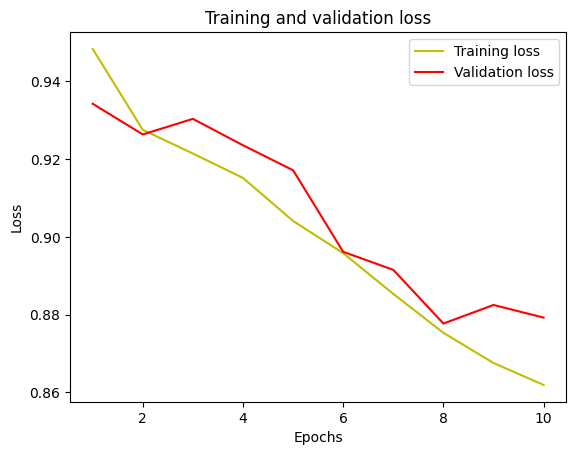

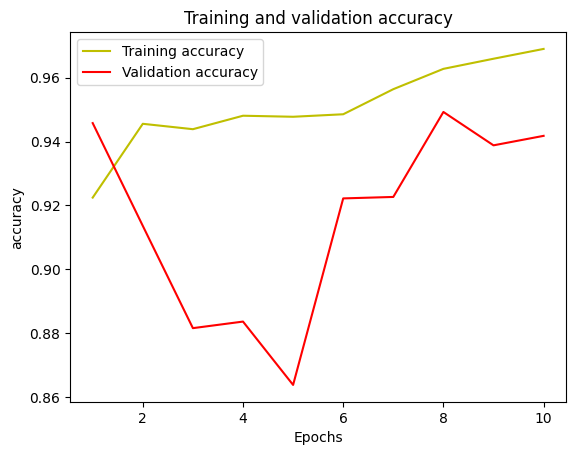

In [33]:
plt.figure()
plt.plot(epochs,loss,'y',label='Training loss')
plt.plot(epochs,val_loss,'r',label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure()
plt.plot(epochs,acc,'y',label='Training accuracy')
plt.plot(epochs,val_acc,'r',label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

In [34]:
from keras.models import load_model
tf.debugging.set_log_device_placement(True)
wt0,wt1,wt2,wt3=0.25,0.25,0.25,0.25
dice_loss=sm.losses.DiceLoss(class_weights=np.array([wt0,wt1,wt2,wt3]))
focal_loss=sm.losses.CategoricalFocalLoss()
total_loss=dice_loss+(1*focal_loss)
metrics=['accuracy',sm.metrics.IOUScore(threshold=0.5)]
LR=0.0001
optim=keras.optimizers.Adam(LR)
steps_per_epoch=len(train_img_list)//batch_size
val_steps_per_epoch=len(val_img_list)//batch_size
my_model=load_model('brats_3d.hdf5',
                   custom_objects={'dice_loss_plus_1focal_loss':total_loss,
                                  'iou_score':sm.metrics.IOUScore(threshold=0.5)})
#my_model = load_model('brats_3d.hdf5', 
                      #compile=False)
history2=my_model.fit(train_img_datagen,
                     steps_per_epoch=steps_per_epoch,
                     epochs=1,
                     verbose=1,
                     validation_data=val_img_datagen,
                     validation_steps=val_steps_per_epoch,)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in d

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in d

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomGetKeyCounter in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op StatelessRandomUniformV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AddV2 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in d

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/rep

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:l

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:l

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Fill in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:l

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /j

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:loc

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing 

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 27/129 [=====>........................] - ETA: 1:54 - loss: 0.8471 - accuracy: 0.9706 - iou_score: 0.5403Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 28/129 [=====>........................] - ETA: 1:53 - loss: 0.8470 - accuracy: 0.9709 - iou_score: 0.5414Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 29/129 [=====>........................] - ETA: 1:52 - loss: 0.8475 - accuracy: 0.9713 -

 49/129 [==========>...................] - ETA: 1:29 - loss: 0.8495 - accuracy: 0.9719 - iou_score: 0.5310Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 50/129 [==========>...................] - ETA: 1:28 - loss: 0.8500 - accuracy: 0.9715 - iou_score: 0.5296Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 51/129 [==========>...................] - ETA: 1:27 - loss: 0.8505 - accuracy: 0.9714 - iou_score: 0.5278Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0


Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 72/129 [===============>..............] - ETA: 1:03 - loss: 0.8565 - accuracy: 0.9690 - iou_score: 0.5096Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 73/129 [===============>..............] - ETA: 1:02 - loss: 0.8565 - accuracy: 0.9690 - iou_score: 0.5094Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 74/129 [================>.............] - ETA: 1:01 - loss: 0.8572 - accuracy: 0.9691 -

 94/129 [====================>.........] - ETA: 39s - loss: 0.8587 - accuracy: 0.9683 - iou_score: 0.5032Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 95/129 [=====================>........] - ETA: 38s - loss: 0.8585 - accuracy: 0.9683 - iou_score: 0.5038Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
 96/129 [=====================>........] - ETA: 37s - loss: 0.8585 - accuracy: 0.9682 - iou_score: 0.5037Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Exe

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
117/129 [==========================>...] - ETA: 13s - loss: 0.8567 - accuracy: 0.9697 - iou_score: 0.5092Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
118/129 [==========================>...] - ETA: 12s - loss: 0.8570 - accuracy: 0.9696 - iou_score: 0.5083Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_train_function_16127 in device /job:localhost/replica:0/task:0/device:GPU:0
119/129 [==========================>...] - ETA: 11s - loss: 0.8576 - accuracy: 0.9697 - io

Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:

Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Identity in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op __inference_test_function_17242 in device /job:

In [33]:
from keras.metrics import MeanIoU

batch_size=2 #Check IoU for a batch of images
test_img_datagen = imageLoader(val_img_dir, val_img_list, 
                                val_mask_dir, val_mask_list, batch_size)

#Verify generator.... In python 3 next() is renamed as __next__()
test_image_batch, test_mask_batch = test_img_datagen.__next__()

test_mask_batch_argmax = np.argmax(test_mask_batch, axis=4)
test_pred_batch = my_model.predict(test_image_batch)
test_pred_batch_argmax = np.argmax(test_pred_batch, axis=4)

print(test_mask_batch_argmax)
print(test_pred_batch_argmax)

n_classes = 4
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(test_pred_batch_argmax, test_mask_batch_argmax)
print("Mean IoU =", IOU_keras.result().numpy())


NameError: name 'my_model' is not defined

In [36]:
img_num=200
test_img=np.load('BraTS2020_TrainingData/input_data_128/val/images/image_'+str(img_num)+'.npy')
test_mask=np.load('BraTS2020_TrainingData/input_data_128/val/masks/mask_'+str(img_num)+'.npy')
test_mask_argmax=np.argmax(test_mask,axis=3)
print(test_mask.shape)

test_img_input=np.expand_dims(test_img,axis=0)
print(test_img_input.shape)

test_prediction=my_model.predict(test_img_input)
print(test_prediction.shape)

test_prediction_argmax=np.argmax(test_prediction,axis=4)[0,:,:,:]
print(test_prediction_argmax.shape)

(128, 128, 128, 4)
(1, 128, 128, 128, 3)
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/re

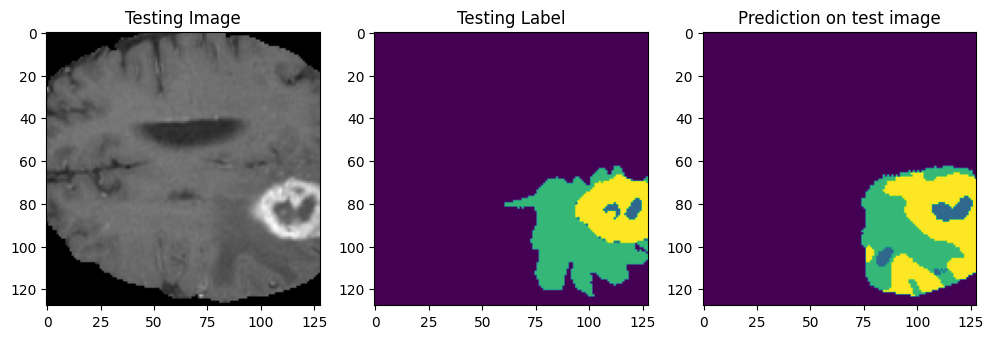

In [37]:
import matplotlib.pyplot as plt
import random
n_slice=82
plt.figure(figsize=(12,8))
plt.subplot(231)
plt.title('Testing Image')
plt.imshow(test_img[:,:,n_slice,1],cmap='gray')

plt.subplot(232)
plt.title('Testing Label')
plt.imshow(test_mask_argmax[:,:,n_slice])


plt.subplot(233)
plt.title('Prediction on test image')
plt.imshow(test_prediction_argmax[:,:,n_slice])

plt.show()

Let's do the reaining in PyTorch

In [34]:
import torch
import torch.nn as nn

class conv_block(nn.Module):
    def __init__(self,in_c,out_c):
        
        super().__init__()

        self.conv1=nn.Conv3d(in_c,out_c,(3, 3, 3),padding=(1, 1,1 ))  
        self.bn1=nn.BatchNorm3d(out_c)

        self.conv2=nn.Conv3d(out_c,out_c,(3, 3, 3),padding=(1, 1,1 ))
        self.bn2=nn.BatchNorm3d(out_c)

        self.relu=nn.ReLU()


    def forward(self,inputs):
        x=self.conv1(inputs)
        x=self.bn1(x)
        x=self.relu(x)
        x=self.conv2(x)
        x=self.bn2(x)
        x=self.relu(x)
        print('converting {} to {}'.format(x.size(),x.size()))

        return x
#-------------------------------------------------------------------------------
class encoder_block(nn.Module):
    def __init__(self,in_c,out_c):
        super().__init__()

        self.conv=conv_block(in_c,out_c)
        self.pool=nn.MaxPool3d((2,2,2))

    def forward(self,inputs):
        x=self.conv(inputs)
        p=self.pool(x)
        return x, p

#-------------------------------------------------------------------------------
class decoder_block(nn.Module):
    def __init__(self,in_c,out_c):
        super().__init__()
        self.up=nn.ConvTranspose3d(in_c,out_c,(2,2,2),stride=(2, 2, 2), padding=(0, 0, 0)) 
        self.conv=conv_block(out_c + out_c,out_c)
        
              
    def forward(self,inputs,skip):
        print('first input  is',inputs.size())
        x=self.up(inputs) 
        print('now input is',x.size())
        print('skip is',skip.size())
        x=torch.cat([x,skip],axis=1)
        x=self.conv(x)
        print('converting {} to {}'.format(inputs.size(),x.size()))
        return x


#-------------------------------------------------------------------------------
class build_unet(nn.Module):
    def __init__(self):
        super().__init__()

        """Encoder"""
        self.e1=encoder_block(3,16)  #1x3x128x128x128   to 1x16x64x64x64     
        self.e2=encoder_block(16,32) #1x16x64x64x64   to 1x32x32x32x32
        self.e3=encoder_block(32,64) #1x32x32x32x32  to 1x64x16x16x16
        self.e4=encoder_block(64,128)  #1x64x16x16x16 to 1x128x8x8x8

        """Bottleneck"""
        self.b=conv_block(128,256) #1x128x8x8x8 to 1x256x8x8x8

        """decoder"""
        self.d1=decoder_block(256,128) #1x256x8x8x8 to 1x128x16x16x16  number of channels= 256 to 128 then +128 
        self.d2=decoder_block(128,64)  #1x128x16x16x16 to 1x64x32x32x32  number of channels= 128 to 64 then +64
        self.d3=decoder_block(64,32)  #1x64x32x32x32 to 1x32x64x64x64  number of channels= 64 to 32 then 32 
        self.d4=decoder_block(32,16)  #1x32x64x64x64 to 1x16x128x128x128  number of channels= 32 to 16 then +16 

        """ Classifier """
        self.outputs=nn.Conv3d(16,4,(1,1,1),padding=(0, 0, 0)) #1x16x128x128x128 to #1x4x128x128x128

    def forward(self,inputs):
        s1,p1=self.e1(inputs) #s1 1x16x128x128x128 p1 1x16x64x64x64
        s2,p2=self.e2(p1)     #s2 1x32x64x64x64    p2 1x32x32x32x32
        s3,p3=self.e3(p2)     #s3 1x64x32x32x32    p3 1x64x16x16x16
        s4,p4=self.e4(p3)     #s4 1x128x16x16x16   p4 1x128x8x8x8

        b=self.b(p4)          #1x128x8x8x8  to #1x256x8x8x8

        print(b.size())
        print(s4.size())
        
        d1=self.d1(b,s4)     #d1 1x128x16x16x16
        d2=self.d2(d1,s3)    #d2 1x64x32x32x32
        d3=self.d3(d2,s2)    #d3 1x32x64x64x64
        d4=self.d4(d3,s1)    #d4 1x16x128x128x128

        outputs= self.outputs(d4) 

        return outputs



In [29]:
def mydice_loss(pred, target):
    """This definition generalize to real valued pred and target vector.
    This should be differentiable.
    pred: tensor with first dimension as batch
    target: tensor with first dimension as batch
    """

    smooth = 1.

    # have to use contiguous since they may from a torch.view op
    iflat = pred[0,:,:,:].view(-1)
    tflat = target[0,:,:,:].view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat * iflat)
    B_sum = torch.sum(tflat * tflat)
    loss_0=1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )
    
    iflat = pred[1,:,:,:].contiguous().view(-1)
    tflat = target[1,:,:,:].contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat * iflat)
    B_sum = torch.sum(tflat * tflat)
    loss_1=1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )
    
    iflat = pred[2,:,:,:].contiguous().view(-1)
    tflat = target[2,:,:,:].contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat * iflat)
    B_sum = torch.sum(tflat * tflat)
    loss_2=1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )
    
    iflat = pred[3,:,:,:].contiguous().view(-1)
    tflat = target[3,:,:,:].contiguous().view(-1)
    intersection = (iflat * tflat).sum()

    A_sum = torch.sum(iflat * iflat)
    B_sum = torch.sum(tflat * tflat)
    loss_3=1 - ((2. * intersection + smooth) / (A_sum + B_sum + smooth) )
    

    
    return (loss_0+loss_1+loss_2+loss_3)/4

In [35]:
x = torch.randn(3,2)
y = torch.transpose(x, 0, 1)
print(x)
print(y)

tensor([[-0.7131, -1.5626],
        [-0.2727,  0.8443],
        [ 0.3239, -0.1741]])
tensor([[-0.7131, -0.2727,  0.3239],
        [-1.5626,  0.8443, -0.1741]])


In [36]:
wt0,wt1,wt2,wt3=0.25,0.25,0.25,0.25
dice_loss=sm.losses.DiceLoss(class_weights=np.array([wt0,wt1,wt2,wt3]))
focal_loss=sm.losses.CategoricalFocalLoss()
total_loss=dice_loss+(1*focal_loss)
metrics=['accuracy',sm.metrics.IOUScore(threshold=0.5)]
LR=0.000001
import torch.optim as optim
#criterion=total_loss
model=build_unet()
#print(criterion.type)
criterion=nn.CrossEntropyLoss()
#criterion=BinaryFocalLoss
#print(criterion.type)
#optimizer=optim.SGD(model.parameters(),lr=LR,momentum=0.9)
#optimizer = keras.optimizers.Adam(LR)
optimizer = torch.optim.Adam(model.parameters(), lr=LR)

Dice Loss

In [58]:
num_epochs=10
final_dice_losses=[]

model=build_unet()
steps_per_epoch=len(train_img_list)//batch_size
val_steps_per_epoch=len(val_img_list)//batch_size

#if use_gpu:
 #   model=model.cuda()
iteration=0
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#model = model.to(device)
for epoch in range(num_epochs):
    
    for img_num in range(steps_per_epoch):
        inputs,target = train_img_datagen.__next__() #load images in a batch one by one
        
        for i in range(batch_size):
            print(img_num,i)
            dice_losses=[]
            #img=img.to(device)
            #msk=msk.to(device)
            new_input=inputs[i]
            new_target=target[i]
            ##print(new_input.shape) #(128, 128, 128, 3)
            ##print(new_target.shape) #(128, 128, 128, 4)

            new_input=new_input.reshape(3,128,128,128)

            #forward
            new_input=np.expand_dims(new_input,axis=0)
            new_input=torch.from_numpy(new_input) #1x3x128x128x128 
            ##print(new_input.size())
            new_input = new_input.float() 

            new_output=model(new_input)
            ##print('outputs size is ', outputs.size()) #1x4x128x128x128
            new_output=new_output.detach().numpy() 
            new_output=np.squeeze(new_output) #4x128x128x128

            
            new_output=new_output.reshape(128,128,128,4)  #128x128x128x4
            ##print('outputs size is ', outputs.shape) 
            new_output=torch.from_numpy(new_output)
            #outputs=np.argmax(outputs,axis=3)
            #print('outputs size is ', outputs.shape) #128x128x128


            #loss
            new_target=torch.from_numpy(new_target)
         
            #new_target=torch.from_numpy(new_target)
            
            new_target = new_target.float() 
            new_output = new_output.float() 
            
            dice_loss = mydice_loss(new_output, new_target)
            
            ##print(loss)
            ##print(loss.type)
            dice_losses.append(dice_loss)
            #iteration+=1
            
        ##print(losses)
        dice_batch_loss=torch.mean(torch.stack(dice_losses))
        ##print(batch_loss.type)

        final_dice_losses.append(dice_batch_loss)
        #backward
        #crossentropy_batch_loss.requires_grad = True
        dice_batch_loss.requires_grad = True
        #optimizer.zero_grad()
        dice_batch_loss.backward()
        #crossentropy_batch_loss.backward()
        #update parameters
        optimizer.step()




0 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
5 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conver

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
8 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
10 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
13 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
21 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
23 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
26 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
34 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
36 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
39 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
47 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
49 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
52 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
60 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
62 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
65 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
67 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

70 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
75 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
78 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
80 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

83 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
88 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
91 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
93 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

96 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
101 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
104 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
106 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

109 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
114 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
117 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
119 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

122 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
127 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
1 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
3 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

6 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
11 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
14 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
16 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
19 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32]

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
29 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
32 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
34 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
37 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
45 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
47 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
50 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
52 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

55 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
60 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
63 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
65 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

68 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
73 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
76 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
78 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

81 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
86 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
89 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
91 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

94 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
99 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
102 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
104 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

107 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
112 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
115 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
117 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

120 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
125 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
128 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
1 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

4 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
9 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conver

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
12 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
14 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

17 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32]

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
25 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64]

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
27 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
30 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
32 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
35 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
43 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
45 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
48 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
56 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
58 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
61 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
69 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
71 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
74 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
82 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
84 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
87 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
89 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

92 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
97 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
100 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
102 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

105 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
110 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
113 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
115 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
118 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
126 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
128 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
2 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
4 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

7 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
12 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
15 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
17 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

20 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
25 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
28 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
30 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

33 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
38 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
41 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
43 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
46 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
54 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
56 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
59 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
61 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

64 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
69 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
72 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
74 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

77 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
82 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
85 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
87 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

90 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
95 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
98 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
100 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
103 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
111 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
113 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
116 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
124 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
126 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
0 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
2 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

5 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
10 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
13 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
15 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

18 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
23 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
26 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
28 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

31 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
36 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
39 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
41 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

44 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
49 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
52 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
54 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
57 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
65 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
67 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
70 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
78 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
80 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
83 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
85 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

88 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
93 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
96 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
98 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

101 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
106 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
109 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
111 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

114 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
119 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
122 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
124 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

127 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
3 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conver

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
6 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
8 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

11 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
16 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
19 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
21 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

24 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
29 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
32 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
34 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

37 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
42 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
45 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
47 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

50 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
55 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
58 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
60 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

63 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
68 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
71 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
73 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

76 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
81 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
84 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
86 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
89 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
97 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
99 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
102 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
110 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
112 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
115 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
123 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
125 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
128 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
7 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
9 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
12 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
20 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
22 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
25 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
33 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
35 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
38 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
46 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
48 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
51 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
53 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
56 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
64 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
66 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
69 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
71 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

74 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
79 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
82 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
84 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

87 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
92 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
95 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
97 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

100 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
105 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
108 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
110 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
113 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
121 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
123 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
126 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
5 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conver

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
7 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
10 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
12 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

15 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
20 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
23 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
25 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
28 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
36 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
38 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
41 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
43 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

46 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
51 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
54 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
56 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

59 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
64 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
67 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
69 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

72 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
77 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
80 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
82 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

85 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
90 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
93 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
95 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

98 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
103 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
106 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
108 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

111 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
116 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
119 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
121 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

124 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
0 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conver

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
3 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16,

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
5 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
8 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
16 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
18 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
21 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
29 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
31 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
34 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
42 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
44 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
47 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
55 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
57 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
60 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 1

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
62 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

65 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 1

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
70 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
73 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
75 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
78 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
86 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
88 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
91 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
99 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
101 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
104 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
112 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
114 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
117 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
119 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

122 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
127 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 1

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
1 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
3 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32,

6 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
11 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
14 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
16 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
19 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
27 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
29 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
32 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
40 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
42 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
45 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
53 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
55 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
58 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
66 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
68 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
71 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
79 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
81 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
84 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
92 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conve

now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
94 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
97 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128,

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
99 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32

102 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
107 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
110 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
112 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
115 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 

converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 64, 32, 32, 32])
first input  is torch.Size([1, 64, 32, 32, 32])
now input is torch.Size([1, 32, 64, 64, 64])
skip is torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
123 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
conv

converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 32, 64, 64, 64])
first input  is torch.Size([1, 32, 64, 64, 64])
now input is torch.Size([1, 16, 128, 128, 128])
skip is torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
125 1
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128

converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 16, 128, 128, 128])
128 0
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 3

[array(0.76, dtype=float32), array(0.74, dtype=float32), array(0.76, dtype=float32), array(0.76, dtype=float32), array(0.79, dtype=float32), array(0.76, dtype=float32), array(0.76, dtype=float32), array(0.73, dtype=float32), array(0.74, dtype=float32), array(0.75, dtype=float32), array(0.77, dtype=float32), array(0.76, dtype=float32), array(0.77, dtype=float32), array(0.78, dtype=float32), array(0.76, dtype=float32), array(0.76, dtype=float32), array(0.77, dtype=float32), array(0.76, dtype=float32), array(0.77, dtype=float32), array(0.81, dtype=float32), array(0.74, dtype=float32), array(0.77, dtype=float32), array(0.79, dtype=float32), array(0.76, dtype=float32), array(0.78, dtype=float32), array(0.79, dtype=float32), array(0.78, dtype=float32), array(0.74, dtype=float32), array(0.73, dtype=float32), array(0.73, dtype=float32), array(0.76, dtype=float32), array(0.75, dtype=float32), array(0.75, dtype=float32), array(0.75, dtype=float32), array(0.78, dtype=float32), array(0.74, dtype=f

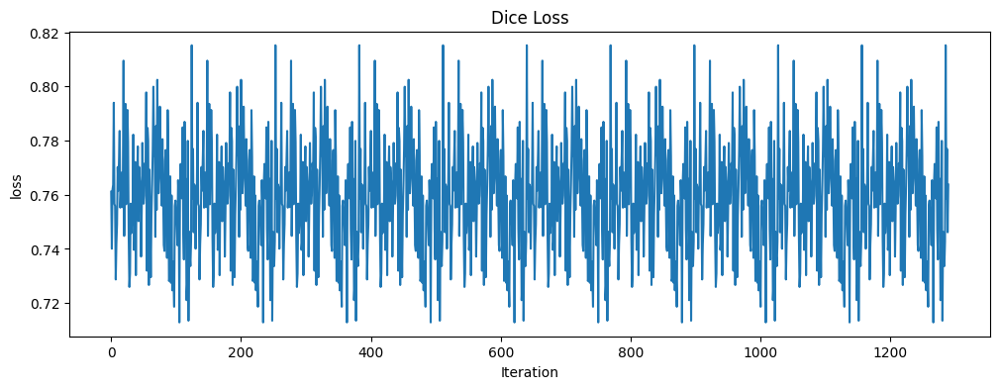

In [61]:
plt.figure(figsize=(12,4))
final_dice_losses=[final_dice_loss.detach().numpy() for final_dice_loss in final_dice_losses]
print(final_dice_losses)
print(batch_size,steps_per_epoch,len(train_img_list))
plt.plot(final_dice_losses)
plt.xlabel('Iteration')
plt.ylabel('loss')
plt.title('Dice Loss')
plt.show()

Cross Entropy Loss

In [38]:
num_epochs=10
final_crossentropy_losses=[]

model=build_unet()
steps_per_epoch=len(train_img_list)//batch_size
val_steps_per_epoch=len(val_img_list)//batch_size

#if use_gpu:
 #   model=model.cuda()
iteration=0
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#model = model.to(device)
for epoch in range(num_epochs):
    for img_num in range(steps_per_epoch):
        print(img_num,epoch)
        inputs,target = train_img_datagen.__next__() #load images in a batch one by one
        inputs=inputs.reshape(2,3,128,128,128)
        
        inputs=torch.tensor(inputs)
        target=torch.tensor(target)
        
        print(inputs.size())
        inputs = inputs.float()
        outputs=model(inputs)
        
        print(target.size())
        target=np.argmax(target,axis=4)
        
        crossentropy_batch_loss=criterion(outputs,target)
        
        final_crossentropy_losses.append(crossentropy_batch_loss)
        
        crossentropy_batch_loss.backward()

        optimizer.step()




0 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
con

now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
5 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
co

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
10 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inpu

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
15 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
20 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
25 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
30 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
35 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
40 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
45 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
50 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
55 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
60 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
65 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
70 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
75 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
80 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
85 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
90 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
95 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
100 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
105 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
110 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
115 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
120 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
125 0
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
1 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
6 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
11 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
16 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
21 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
26 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
31 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
36 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
41 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
46 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
51 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
56 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
61 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
66 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
71 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
76 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
95 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
100 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inp

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
105 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
110 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
115 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
120 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
125 1
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
1 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
6 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
11 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
16 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
21 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
26 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
31 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
36 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
41 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
46 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
51 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
56 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
61 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
80 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
85 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inpu

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
90 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
95 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
100 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
119 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])


converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
124 2
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inp

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
0 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
5 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
10 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
15 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
20 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
25 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
30 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
49 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
54 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inpu

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
59 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
64 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
69 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
74 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
79 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
84 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
89 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
94 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 12

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
118 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])


converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
123 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inp

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
128 3
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
18 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
23 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inpu

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
28 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
33 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
38 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
43 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
48 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
53 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 12

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
73 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
78 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
83 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
93 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
98 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
103 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
108 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
118 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
123 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
128 4
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
4 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
9 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
14 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
19 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
24 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
29 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
34 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
39 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
44 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
49 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
54 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
59 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
64 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
69 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
74 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
79 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
84 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
94 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
99 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
104 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
109 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
114 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
119 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
124 5
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
0 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
5 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
10 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
15 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
20 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
30 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
35 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
40 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
45 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
64 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
69 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inpu

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
74 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
79 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
84 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
89 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
94 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
99 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
104 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
109 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
114 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
119 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
124 6
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
0 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
5 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
10 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
15 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converti

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
20 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
25 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
30 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
35 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
40 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
45 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
50 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
55 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
60 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
75 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
80 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16

converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
99 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 256, 8, 8, 8])
now input is torch.Size([2, 128, 16, 16, 16])
skip is torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is

converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
104 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 256, 8, 8, 8])
torch.Size([2, 128, 16, 16, 16])
first inp

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
109 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
114 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
124 7
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
0 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
5 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
10 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
15 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
20 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
25 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
30 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
35 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
40 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
45 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
50 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
55 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
60 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
65 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
70 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
75 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
85 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
90 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
95 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
100 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
105 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
110 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
115 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
120 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
125 8
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
1 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
6 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
11 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
16 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
21 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
26 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
31 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
36 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converti

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
41 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
46 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
51 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
56 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 128, 16, 16, 16])
converting torch.Size([2, 256, 8, 8, 8]) to torch.Size([2, 128, 16, 16, 16])
first input  is torch.Size([2, 128, 16, 16, 16])
now input is torch.Size([2, 64, 32, 32, 32])
skip is torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
66 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
71 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
76 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
81 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
86 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
91 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
96 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torc

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
101 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
106 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
111 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
116 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
121 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 64, 32, 32, 32])
converting torch.Size([2, 128, 16, 16, 16]) to torch.Size([2, 64, 32, 32, 32])
first input  is torch.Size([2, 64, 32, 32, 32])
now input is torch.Size([2, 32, 64, 64, 64])
skip is torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting torch.Size([2, 64, 32, 32, 32]) to torch.Size([2, 32, 64, 64, 64])
first input  is torch.Size([2, 32, 64, 64, 64])
now input is torch.Size([2, 16, 128, 128, 128])
skip is torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 16, 128, 128, 128])
torch.Size([2, 128, 128, 128, 4])
126 9
torch.Size([2, 3, 128, 128, 128])
converting torch.Size([2, 16, 128, 128, 128]) to torch.Size([2, 16, 128, 128, 128])
converting torch.Size([2, 32, 64, 64, 64]) to torch.Size([2, 32, 64, 64, 64])
converting tor

2 129 258


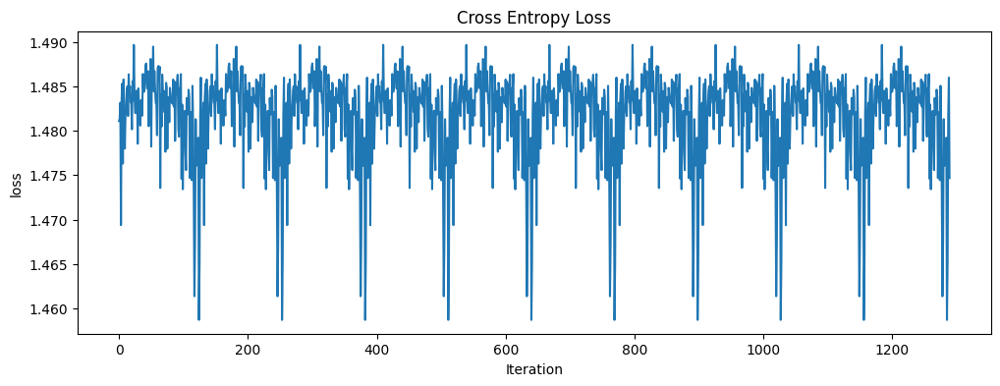

In [40]:
plt.figure(figsize=(12,4))
final_crossentropy_losses=[final_loss.detach().numpy() for final_loss in final_crossentropy_losses]
print(batch_size,steps_per_epoch,len(train_img_list))
plt.plot(final_crossentropy_losses)
plt.xlabel('Iteration')
plt.ylabel('loss')
plt.title('Cross Entropy Loss')
plt.show()

/'Analyze the results

In [43]:
def evaluate_model(model, datagen):
    model.eval()  # for batch normalization layers
    corrects = 0
    alloutputs=[]
    with torch.no_grad():
        inputs,target = train_img_datagen.__next__()
        for i in range(batch_size):
            new_input=inputs[i]
            new_target=target[i]
            print(new_input.shape) #(128, 128, 128, 3)
            print(new_target.shape) #(128, 128, 128, 4)

            new_input=new_input.reshape(3,128,128,128)

            #forward
            new_input=np.expand_dims(new_input,axis=0)
            new_input=torch.from_numpy(new_input) #1x3x128x128x128 
            print(new_input.size())
            new_input = new_input.float() 

            outputs=model(new_input) #1x4x128x128x128 
            outputs=outputs.detach().numpy() 
            outputs=np.squeeze(outputs)
            outputs=np.argmax(outputs,axis=0) #4x128x 128x 128
            print('outputs',outputs.shape) #128x 128x 128
            
            alloutputs.append(outputs)
            new_target=np.argmax(new_target,axis=3) #128x 128x 128x 4
            print('new_target',new_target.shape) #128x 128x 128
    
            print(np.count_nonzero((outputs == new_target)))
            corrects += (np.count_nonzero((outputs == new_target)))
            
    print('accuracy: {:.2f}'.format(100 * corrects / len(train_img_list)/(128*128*128)))
    print(corrects)
    
    
    return alloutputs


In [44]:
evaluate_model(model, train_img_datagen)

(128, 128, 128, 3)
(128, 128, 128, 4)
torch.Size([1, 3, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to t

[array([[[1, 3, 1, ..., 1, 1, 1],
         [1, 1, 1, ..., 3, 3, 3],
         [3, 3, 0, ..., 1, 0, 0],
         ...,
         [3, 1, 1, ..., 1, 3, 3],
         [2, 1, 2, ..., 1, 1, 1],
         [1, 3, 1, ..., 1, 3, 1]],
 
        [[1, 3, 1, ..., 1, 1, 3],
         [0, 1, 1, ..., 0, 1, 3],
         [0, 1, 1, ..., 1, 1, 1],
         ...,
         [0, 0, 0, ..., 1, 1, 3],
         [0, 1, 1, ..., 3, 1, 3],
         [1, 1, 1, ..., 3, 3, 0]],
 
        [[1, 1, 1, ..., 3, 1, 3],
         [3, 1, 3, ..., 1, 3, 1],
         [1, 3, 3, ..., 0, 1, 3],
         ...,
         [0, 2, 3, ..., 1, 1, 3],
         [2, 1, 1, ..., 1, 3, 3],
         [1, 2, 3, ..., 3, 1, 1]],
 
        ...,
 
        [[0, 3, 3, ..., 1, 3, 3],
         [1, 1, 1, ..., 1, 2, 1],
         [1, 3, 3, ..., 3, 0, 3],
         ...,
         [0, 3, 0, ..., 1, 1, 2],
         [0, 1, 3, ..., 1, 3, 3],
         [1, 1, 1, ..., 3, 1, 1]],
 
        [[1, 1, 1, ..., 1, 1, 3],
         [3, 1, 1, ..., 1, 3, 1],
         [2, 3, 1, ..., 1, 1, 1],

In [238]:
test_predictions_argmax=evaluate_model(model, test_img_datagen)

(128, 128, 128, 3)
(128, 128, 128, 4)
torch.Size([1, 3, 128, 128, 128])
converting torch.Size([1, 16, 128, 128, 128]) to torch.Size([1, 16, 128, 128, 128])
converting torch.Size([1, 32, 64, 64, 64]) to torch.Size([1, 32, 64, 64, 64])
converting torch.Size([1, 64, 32, 32, 32]) to torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 256, 8, 8, 8])
torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 256, 8, 8, 8])
now input is torch.Size([1, 128, 16, 16, 16])
skip is torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 128, 16, 16, 16]) to torch.Size([1, 128, 16, 16, 16])
converting torch.Size([1, 256, 8, 8, 8]) to torch.Size([1, 128, 16, 16, 16])
first input  is torch.Size([1, 128, 16, 16, 16])
now input is torch.Size([1, 64, 32, 32, 32])
skip is torch.Size([1, 64, 32, 32, 32])
converting torch.Size([1, 64, 32, 32, 32]) to t